In [16]:
print("Hello, testing HW on pynq environment")

Hello, testing HW on pynq environment


In [17]:
# 2. 레지스터 오프셋 정의 (C 코드 구조체 기반)
REG_CONFIG  = 0x00
REG_SIZE    = 0x04
REG_COEFF_R = [0x0C, 0x10, 0x14]
REG_COEFF_G = [0x18, 0x1C, 0x20]
REG_COEFF_B = [0x24, 0x28, 0x2C]

In [18]:
from pynq import Overlay, allocate
import numpy as np
from PIL import Image
import time

In [19]:
# 1. 내가 만든 하드웨어(125MHz Conv 가속기)를 FPGA에 입힌다!
overlay = Overlay("design_1.bit")
dma = overlay.axi_dma_0
accel = overlay.myip_0

In [20]:
# 2. 바이너리 파일로부터 Raw 데이터 읽기
raw_data = np.fromfile("1920x1080_florence.rgba", dtype=np.uint8)

# 데이터 모양(Shape) 잡아주기 (Height, Width, Channel)
# RGBA이므로 채널은 4입니다.
img_array = raw_data.reshape((1080, 1920, 4))

# 3. 리눅스 커널에 '연속된 물리 메모리(CMA)'를 달라고 요청 (OS와의 소통)
in_buffer = allocate(shape=img_array.shape, dtype=np.uint8)
out_buffer = allocate(shape=img_array.shape, dtype=np.uint8)
in_buffer[:] = img_array

In [21]:
# --- [중요] 하드웨어 레지스터 설정 시퀀스 ---

# 4. IP 리셋 (bit 4: Reset)
accel.write(REG_CONFIG, (1 << 4)) # (Self-clearing)

# 5. 이미지 사이즈 설정 (Width-1, Height-1)
# C코드: ((uint16_t)(1080 - 1) << 16) | (uint16_t)(1920 - 1)
size_val = ((1080 - 1) << 16) | (1920 - 1)
accel.write(REG_SIZE, size_val)

# 6. 커널 계수 설정 (샤프닝 필터 예시: -1, 9, -1)
def pack_coeffs(c1, c2, c3):
    return ((c1 & 0xFF) << 16) | ((c2 & 0xFF) << 8) | (c3 & 0xFF)

# R, G, B 채널에 동일한 샤프닝 필터 적용
coeffs = [
    [0, -1, 0], 
    [-1, 5, -1], 
    [0, -1, 0]
]
for i in range(3):
    val = pack_coeffs(coeffs[i][0], coeffs[i][1], coeffs[i][2])
    accel.write(REG_COEFF_R[i], val)
    accel.write(REG_COEFF_G[i], val)
    accel.write(REG_COEFF_B[i], val)

# 7. 가속기 활성화 (bit 0: Enable)
accel.write(REG_CONFIG, (1 << 0))

In [22]:
# --- [중요] DMA 전송 시퀀스 (Recv -> Send) ---
hw_start = time.time()
# 8. DMA 실행
dma.recvchannel.transfer(out_buffer) # 수신 먼저 예약 (그릇 준비)
dma.sendchannel.transfer(in_buffer)  # 송신 시작

# 9. 완료 대기
dma.sendchannel.wait()
dma.recvchannel.wait()
hw_end = time.time()
print(f"{hw_end - hw_start:.5f} sec")

0.02135 sec


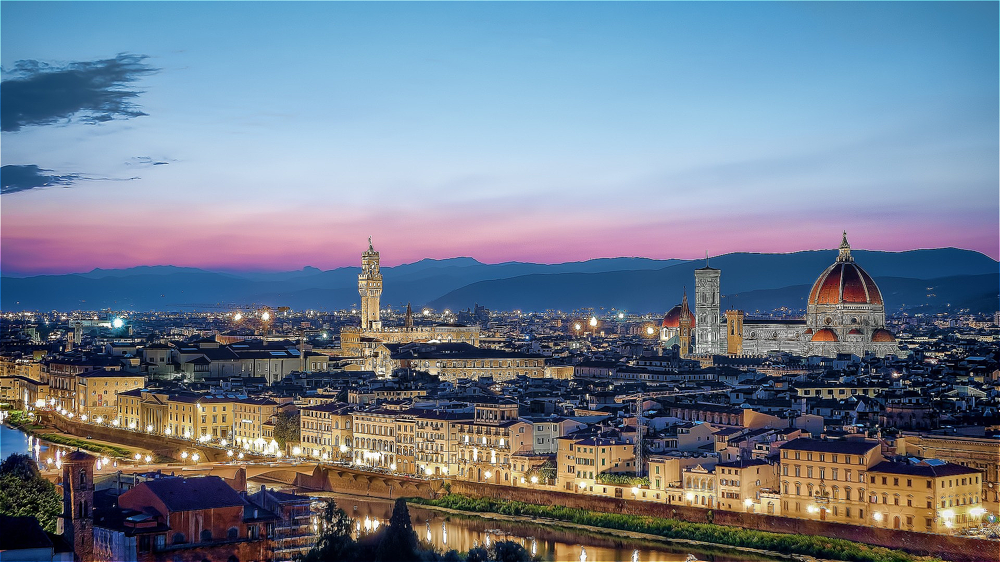

In [23]:
# 10. 결과 확인
result_img = Image.fromarray(out_buffer)
display(result_img) # 주피터 노트북에서 즉시 출력

In [24]:
import cv2
kernel = np.array(coeffs)
out_buffer = allocate(shape=img_array.shape, dtype=np.uint8)

In [25]:
cv_start = time.time()
out_buffer = cv2.filter2D(in_buffer, -1, kernel)
cv_end = time.time()
print(f"{cv_end - cv_start:.5f} sec")

0.75895 sec


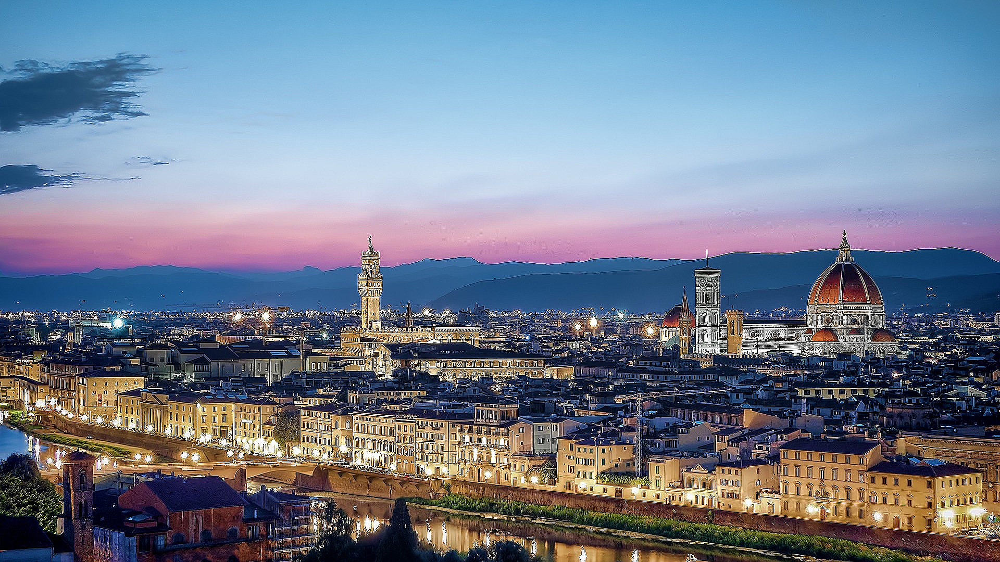

In [26]:
# 10. 결과 확인
result_img = Image.fromarray(out_buffer)
display(result_img) # 주피터 노트북에서 즉시 출력

In [27]:
print(f"HW took {hw_end - hw_start:.5f} sec")
print(f"CV took {cv_end - cv_start:.5f} sec")

HW took 0.02135 sec
CV took 0.75895 sec
